# Benchmark 

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import os
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
from scipy import sparse

# from matplotlib import font_manager, rcParams
# custom_rc = {
#     'font.family': 'DejaVu Sans',
# }

# mpl.rcParams['svg.fonttype'] = 'none'
# mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "dkd_Wilson"
file_name = "dkd_Wilson"
file_suffix = time.strftime('%b%d-%H%M')

save_dir = Path(f"../save/{proj_name}-{file_suffix}")
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)

seed = 0
ccd.ul.set_seed(seed)

In [4]:
# load the data
adata = sc.read_h5ad(data_dir / f"{file_name}.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'default_embedding', 'schema_reference', 'schema_version', 'title'


### preprocessing

In [6]:
# ---------------------- Config ----------------------
MIN_GENES = 300
MIN_CELLS_PER_GENE = 5
N_TOP_HVG = 5000
N_PCS = 300

# ---------------------- Restart from Raw ----------------------
adata = adata.raw.to_adata()
print(f"✅ Restarted from raw: {adata.shape}")

# ---------------------- Add 'counts' Layer ----------------------
# Ensure integer counts and store them
if not np.issubdtype(adata.X.dtype, np.integer):
    adata.X = adata.X.astype("int32")
adata.layers["counts"] = adata.X.copy()

# ---------------------- QC Metrics ----------------------
sc.pp.calculate_qc_metrics(adata, inplace=True)

✅ Restarted from raw: (39176, 36398)


In [7]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'


In [8]:
adata.obs['sample_uuid'].value_counts().to_dict()

{'8949b21f-6f57-40c0-8f7b-0d6e9bff05cd': 8706,
 'e7372715-150e-4117-a11b-a88ea56ce5c5': 5278,
 'c47a5959-a0ed-4276-8a8d-5f136f1edd29': 3819,
 '84824920-47bc-4929-b123-87574944aa37': 3707,
 'd8b737fb-8a38-4a1d-a421-cbc81edddd05': 3605,
 '7605a4f4-e667-4418-85ec-c42e9ab8c761': 2996,
 'f94a777a-0e6c-4361-a4ad-9472f69d46f3': 2587,
 '370769d1-96bd-4392-8ac4-56ab409e69a0': 2574,
 '8628f96c-2d97-4579-951c-044017ef6f0e': 2552,
 'd8149de2-123d-4852-a822-d8aee03b6266': 2468,
 '1ee72dd6-e794-4793-b58b-b763e3bf1fed': 884}

In [9]:
# ---------------------- Cell Filtering ----------------------
adata = adata[adata.obs.n_genes_by_counts > MIN_GENES, :]
adata.write(data_dir / f"{file_name}_preprocessed.h5ad")
adata.shape

(39176, 36398)

In [10]:
# ---------------------- Gene Filtering ----------------------
sc.pp.filter_genes(adata, min_cells=MIN_CELLS_PER_GENE)
adata.shape

(39176, 27911)

In [11]:
# ---------------------- Set Filtered Raw ----------------------
adata.raw = adata.copy()

# ---------------------- Normalize & Log Transform ----------------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# ---------------------- Highly Variable Genes ----------------------
sc.pp.highly_variable_genes(
    adata,
    flavor='seurat_v3',
    n_top_genes=N_TOP_HVG,
    subset=False
)

# ---------------------- PCA ----------------------
sc.tl.pca(
    adata,
    n_comps=N_PCS,
    svd_solver='arpack',
    use_highly_variable=True
)

# ---------------------- Subset to HVGs ----------------------
adata = adata[:, adata.var.highly_variable].copy()
adata.write(data_dir / f"{file_name}_preprocessed_HVG.h5ad")  # after HVG subsetting

print(f"✅ Preprocessing complete: {adata.shape}. 'counts' saved in layers and raw.")

✅ Preprocessing complete: (39176, 5000). 'counts' saved in layers and raw.


### run integration methods

In [4]:
adata = sc.read_h5ad(data_dir / f"{file_name}_preprocessed_HVG.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 39176 × 5000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
 

In [ ]:
import subprocess, json
methods = ["unintegrated", "harmony", "liger", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

# concord_args = {
#     "encoder_dims": [512, 256],
#     "beta": 0.1,
#     "n_epochs": 10
# }

output_dir = '../jobs'
device = 'auto'
conda_env = 'concord_env'
batch_key = 'sample_uuid'  # Use the same batch key as in the notebook  
state_key = 'cell_type'
latent_dim = '50'  # Adjust as needed, but should match the encoder_dims in concord_args

mode = 'local'

subprocess.run([
    "python", "./generate_py_jobs.py",
    "--proj_name", proj_name,
    "--adata_filename", f"{file_name}_preprocessed_HVG.h5ad",
    "--methods", *methods,
    "--batch_key", batch_key,
    "--state_key", state_key,
    "--latent_dim", latent_dim,
    "--output_dir", output_dir,
    "--device", device,
    "--conda_env", conda_env,
    "--runtime", "02:00:00",
    "--mode", mode,
    # "--concord_kwargs", json.dumps(concord_args)
    "--verbose"
], check=True)

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_unintegrated.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_unintegrated.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_harmony.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_harmony.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_liger.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_liger.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scanorama.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scanorama.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scvi.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scvi.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_contrastive.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_contrastive.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_knn.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_knn.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_W

CompletedProcess(args=['python', './generate_py_jobs.py', '--proj_name', 'dkd_Wilson', '--adata_filename', 'dkd_Wilson_preprocessed_HVG.h5ad', '--methods', 'unintegrated', 'harmony', 'liger', 'scanorama', 'scvi', 'contrastive', 'concord_knn', 'concord_hcl', '--batch_key', 'sample_uuid', '--state_key', 'cell_type', '--latent_dim', '50', '--output_dir', '../jobs', '--device', 'auto', '--conda_env', 'concord_env', '--runtime', '02:00:00', '--mode', 'local'], returncode=0)

In [10]:
proj_folder = Path(output_dir) / f"benchmark_{proj_name}"
proj_folder.mkdir(parents=True, exist_ok=True)  # defensive

submit_all = proj_folder / f"submit_all_{proj_name}.sh"

with submit_all.open("w") as f:
    f.write("#!/bin/bash\n")
    f.write("# Auto-generated — sequentially runs every benchmark Python file\n")
    f.write('cd "$(dirname "$0")"\n\n')

    f.write("source ~/.bashrc\n")
    f.write("conda activate concord_env\n\n")    
    f.write("timestamp=$(date +'%m%d-%H%M')\n\n")

    # Set the Python executable to use
    f.write('py_exec="${PYTHON_EXEC:-python}"\n\n')

    for py_file in sorted(proj_folder.glob(f"benchmark_{proj_name}_*.py")):
        base = py_file.stem
        f.write(f"echo '🔄 Running: {py_file.name} (log: {base}_${{timestamp}}.log)'\n")
        f.write(f"${{py_exec}} {py_file.name} > {base}_${{timestamp}}.log 2>&1\n")
        f.write("echo '✅ Done.'\n\n")

submit_all.chmod(0o755)
print(f"📌  Next step: Run “{submit_all}” to execute all batch integration methods sequentially.")

📌  Next step: Run “../jobs/benchmark_dkd_Wilson/submit_all_dkd_Wilson.sh” to execute all batch integration methods sequentially.


In [15]:
# Run “{submit_all}” to execute all batch integration methods sequentially.
!bash {submit_all}

🔄 Running: benchmark_dkd_Wilson_concord_hcl.py (log: benchmark_dkd_Wilson_concord_hcl_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_dkd_Wilson_concord_knn.py (log: benchmark_dkd_Wilson_concord_knn_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_dkd_Wilson_contrastive.py (log: benchmark_dkd_Wilson_contrastive_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_dkd_Wilson_harmony.py (log: benchmark_dkd_Wilson_harmony_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_dkd_Wilson_liger.py (log: benchmark_dkd_Wilson_liger_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_dkd_Wilson_scanorama.py (log: benchmark_dkd_Wilson_scanorama_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_dkd_Wilson_scvi.py (log: benchmark_dkd_Wilson_scvi_${timestamp}.log)
✅ Done.
🔄 Running: benchmark_dkd_Wilson_unintegrated.py (log: benchmark_dkd_Wilson_unintegrated_${timestamp}.log)
✅ Done.


----

In [4]:
# load adata with genes without HVG selection
adata = sc.read_h5ad(data_dir / f"{file_name}_preprocessed.h5ad")

methods = ["unintegrated", "liger", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

In [5]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'


In [6]:
from benchmark_utils import add_embeddings

adata = add_embeddings(adata, proj_name=proj_name, methods=methods)

✅ obsm['unintegrated'] loaded
✅ obsm['liger'] loaded
✅ obsm['harmony'] loaded
✅ obsm['scanorama'] loaded
✅ obsm['scvi'] loaded
✅ obsm['contrastive'] loaded
✅ obsm['concord_knn'] loaded
✅ obsm['concord_hcl'] loaded


In [7]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'


In [8]:
# save adata with all embeddings
adata.write_h5ad(data_dir / f"{file_name}_final.h5ad")

----

In [16]:
# map the obsm back to the adata 
# for each method, uses the most recent run (based on timestamp)
# methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]

from benchmark_utils import add_embeddings

adata = add_embeddings(adata, proj_name=proj_name, methods=methods)



✅ obsm['scvi'] loaded
✅ obsm['harmony'] loaded
✅ obsm['scanorama'] loaded
✅ obsm['unintegrated'] loaded
✅ obsm['concord_hcl'] loaded
✅ obsm['concord_knn'] loaded
✅ obsm['contrastive'] loaded
✅ obsm['liger'] loaded


In [17]:
for method in methods:
    if f"{method}_UMAP" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 2D UMAP for {method}...")
        ccd.ul.run_umap(adata, source_key=f"{method}", result_key=f"{method}_UMAP", n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP'] computed")
    if f"{method}_UMAP_3D" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP_3D'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 3D UMAP for {method}...")
        ccd.ul.run_umap(adata,source_key=f"{method}",result_key=f"{method}_UMAP_3D",n_components=3,  min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP_3D'] computed")

ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")
print(f"✅ Embeddings saved to {save_dir / f'obsm_{file_suffix}.h5'}")
final_path = data_dir / f"{file_name}_final.h5ad"
adata.write_h5ad(final_path)
print(f"✅ Final AnnData saved to: {final_path}")

Computing 2D UMAP for scvi...
concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP']
✅ obsm['scvi_UMAP'] computed
Computing 3D UMAP for scvi...
concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP_3D']
✅ obsm['scvi_UMAP_3D'] computed
Computing 2D UMAP for harmony...
concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP']
✅ obsm['harmony_UMAP'] computed
Computing 3D UMAP for harmony...
concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP_3D']
✅ obsm['harmony_UMAP_3D'] computed
Computing 2D UMAP for scanorama...
concord - INFO - UMAP embedding stored in adata.obsm['scanorama_UMAP']
✅ obsm['scanorama_UMAP'] computed
Computing 3D UMAP for scanorama...
concord - INFO - UMAP embedding stored in adata.obsm['scanorama_UMAP_3D']
✅ obsm['scanorama_UMAP_3D'] computed
Computing 2D UMAP for unintegrated...
concord - INFO - UMAP embedding stored in adata.obsm['unintegrated_UMAP']
✅ obsm['unintegrated_UMAP'] computed
Computing 3D UMAP for unintegrated.

In [4]:
data_dir = Path(f"../data/concord_1-0-3_0603")
adata = sc.read_h5ad(data_dir / f"{file_name}_final.h5ad")

In [7]:
methods = ["unintegrated", "liger", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

batch_key = 'sample_uuid'
state_key = 'cell_type'

concord.plotting.pl_embedding - INFO - Plotting unintegrated with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with sample_uuid in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with sample_uuid in UMAP


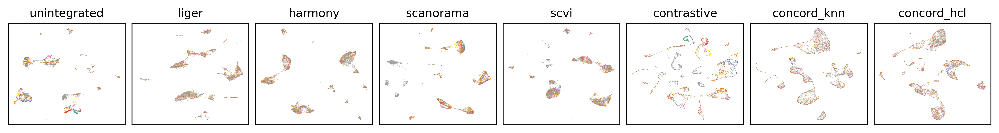

concord.plotting.pl_embedding - INFO - Plotting unintegrated with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting scvi with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with cell_type in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with cell_type in UMAP


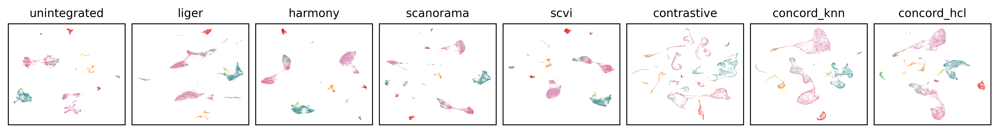

In [8]:
# plot everything
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = [batch_key, state_key]
basis_types = ['UMAP']

font_size=10
point_size=.1
alpha=0.8
ncols = len(show_keys)
figsize=(ncols * 1.5,1.5)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = {'donor_id': 'Set1', 
       'cell_type': 'Set1'}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=show_cols,
        basis_types=basis_types,
        pal=pal,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        save_dir=save_dir,
        file_suffix=file_suffix,
        dpi=600,
        save_format='svg'
    )


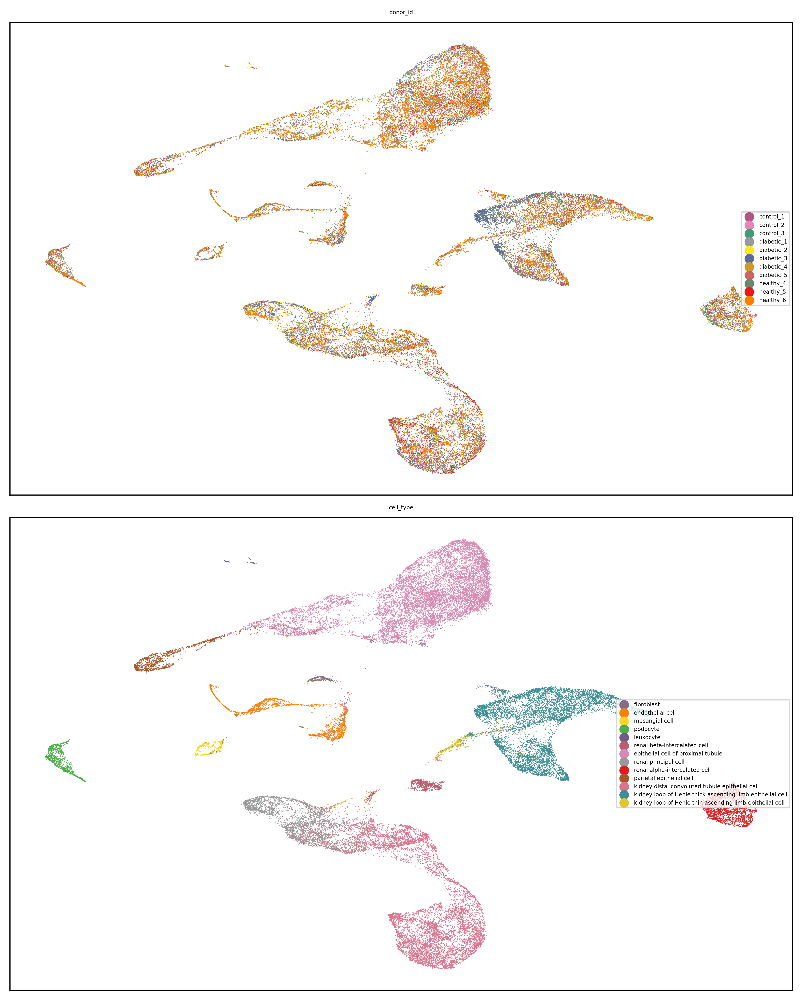

In [11]:
output_key = 'concord_hcl'
basis = output_key
show_basis = basis + '_UMAP'
show_cols = ['donor_id', 'cell_type']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(8,10), dpi=600, ncols=1, font_size=4, point_size=2, legend_loc='right',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

In [5]:
print(data_dir)
print(proj_name)
print(file_suffix)

../data/dkd_Wilson
dkd_Wilson
Jul03-0120


In [6]:
final_path = data_dir / f"{file_name}_final.h5ad"
adata = sc.read_h5ad(final_path)

In [7]:
adata

AnnData object with n_obs × n_vars = 39176 × 5000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
 

In [8]:
adata.var_names

Index(['ENSG00000241180', 'ENSG00000223764', 'ENSG00000242590',
       'ENSG00000186891', 'ENSG00000186827', 'ENSG00000176022',
       'ENSG00000184163', 'ENSG00000260179', 'ENSG00000162572',
       'ENSG00000225285',
       ...
       'ENSG00000165246', 'ENSG00000286201', 'ENSG00000131007',
       'ENSG00000176728', 'ENSG00000226906', 'ENSG00000205944',
       'ENSG00000223641', 'ENSG00000276345', 'ENSG00000278633',
       'ENSG00000277196'],
      dtype='object', length=5000)

In [16]:
# Keep original var_names just in case
adata.var['ensembl_id'] = adata.var_names

# Extract gene symbols from 'feature_name' (before underscore)
adata.var_names = adata.var['feature_name']

In [17]:
adata.var_names

CategoricalIndex(['ENSG00000241180.1', 'LINC02593', 'ENSG00000242590.1',
                  'TNFRSF18_ENSG00000186891', 'TNFRSF4_ENSG00000186827',
                  'B3GALT6_ENSG00000176022', 'C1QTNF12_ENSG00000184163',
                  'ENSG00000260179.1', 'SCNN1D_ENSG00000162572', 'LINC01770',
                  ...
                  'NLGN4Y_ENSG00000165246', 'ENSG00000286201.1', 'TTTY9B',
                  'TTTY14', 'TTTY4', 'DAZ2', 'TTTY17C', 'ENSG00000276345.1',
                  'ENSG00000278633.1', 'ENSG00000277196.4'],
                 categories=['A2M_ENSG00000175899', 'AADACL2-AS1', 'AANAT_ENSG00000129673', 'AARD_ENSG00000205002', ..., 'ZPLD1_ENSG00000170044', 'ZRANB2-DT', 'ZSCAN4_ENSG00000180532', 'ZYG11A_ENSG00000203995'], ordered=False, dtype='category', name='feature_name', length=5000)

In [18]:
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='hsa')
print(f"Saved viscello to {data_dir / f'cello_{proj_name}_{file_suffix}'}")

VisCello project created at ../data/dkd_Wilson/cello_dkd_Wilson_Jul03-0120
Saved viscello to ../data/dkd_Wilson/cello_dkd_Wilson_Jul03-0120


# Benchmarking

In [5]:
methods = ["unintegrated", "liger", "harmony", "scanorama", "scvi", "contrastive", "concord_knn", "concord_hcl"]

✅ Benchmark summary saved to: ../save/dkd_Wilson-Jul07-1650/benchmark_summary_Jul07-1650.tsv


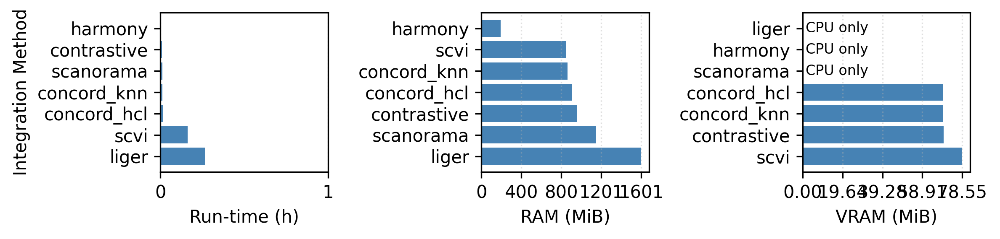

In [6]:
from benchmark_utils import collect_benchmark_logs
bench_df = collect_benchmark_logs("dkd_Wilson", methods)
# Save the benchmark results
bench_df.to_csv(save_dir / f"benchmark_summary_{file_suffix}.tsv", sep="\t", index=False)
print(f"✅ Benchmark summary saved to: {save_dir / f'benchmark_summary_{file_suffix}.tsv'}")
# Plot benchmark results
from benchmark_utils import plot_benchmark_performance
import matplotlib.pyplot as plt
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}
with plt.rc_context(rc=custom_rc):
    plot_benchmark_performance(bench_df, figsize=(8,2), dpi=300, save_path = save_dir / f"benchmark_plot_{file_suffix}.pdf")


concord.benchmarking.benchmark - INFO - Running SCIB benchmark


Embeddings: 100%|██████████| 8/8 [05:52<00:00, 44.12s/it]


concord.benchmarking.benchmark - INFO - Running Probe benchmark
concord.benchmarking.benchmark - INFO - Running linear probe for state with keys ['unintegrated', 'harmony', 'liger', 'scanorama', 'scvi', 'contrastive', 'concord_knn', 'concord_hcl']
Detected task: classification
concord.benchmarking.benchmark - INFO - Running linear probe for batch with keys ['unintegrated', 'harmony', 'liger', 'scanorama', 'scvi', 'contrastive', 'concord_knn', 'concord_hcl']
Detected task: classification
concord.benchmarking.benchmark - INFO - Running k-NN probe for state with keys ['unintegrated', 'harmony', 'liger', 'scanorama', 'scvi', 'contrastive', 'concord_knn', 'concord_hcl']
[KNN] detected task: classification
concord.benchmarking.benchmark - INFO - Running k-NN probe for batch with keys ['unintegrated', 'harmony', 'liger', 'scanorama', 'scvi', 'contrastive', 'concord_knn', 'concord_hcl']
[KNN] detected task: classification


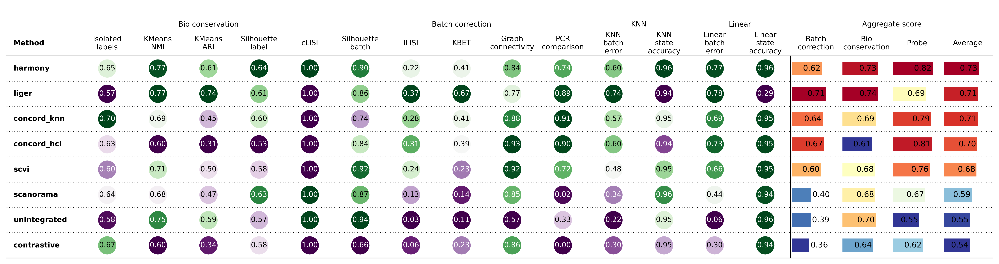

✅ Benchmark results saved to: ../save/dkd_Wilson-Jul02-0240/benchmark_cell_type_Jul02-0240.pkl


In [30]:
# Run the benchmark pipeline
out = ccd.bm.run_benchmark_pipeline(
    adata,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_celltype",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("scib","probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_celltype = out["combined"]

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_{state_key}_{file_suffix}.pkl'}")